Importamos librearias necesarias

In [404]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
%matplotlib inline

In [3]:
from scipy.stats import norm
import lightgbm as lgb
from sklearn.metrics import mean_squared_log_error
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import cross_val_score, cross_val_predict

Cargamos el dataset  visualizamos informacion del mismo, tamaño, detalle de columnas, etc

In [4]:
df = pd.read_csv('C:\\Users\\fpallares\\Documents\\Test tecnico\\Teste Técnico - DS_\\full_devices.csv', encoding='iso-8859-1')

In [5]:
df.shape

(124494, 12)

In [6]:
df.info() #Vemos que no tenemos mucha informacion de las columnas con sus nombres

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124494 entries, 0 to 124493
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   date        124494 non-null  object
 1   device      124494 non-null  object
 2   failure     124494 non-null  int64 
 3   attribute1  124494 non-null  int64 
 4   attribute2  124494 non-null  int64 
 5   attribute3  124494 non-null  int64 
 6   attribute4  124494 non-null  int64 
 7   attribute5  124494 non-null  int64 
 8   attribute6  124494 non-null  int64 
 9   attribute7  124494 non-null  int64 
 10  attribute8  124494 non-null  int64 
 11  attribute9  124494 non-null  int64 
dtypes: int64(10), object(2)
memory usage: 11.4+ MB


In [7]:
df.describe()

,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9
count,124494.000000,1.244940e+05,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000
mean,0.000851,1.223881e+08,159.484762,9.940455,1.741120,14.222669,260172.657726,0.292528,0.292528,12.451524
std,0.029167,7.045933e+07,2179.657730,185.747321,22.908507,15.943028,99151.078547,7.436924,7.436924,191.425623
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.000000,8.000000,0.000000,0.000000,0.000000
25%,0.000000,6.128476e+07,0.000000,0.000000,0.000000,8.000000,221452.000000,0.000000,0.000000,0.000000
50%,0.000000,1.227974e+08,0.000000,0.000000,0.000000,10.000000,249799.500000,0.000000,0.000000,0.000000
75%,0.000000,1.833096e+08,0.000000,0.000000,0.000000,12.000000,310266.000000,0.000000,0.000000,0.000000
max,1.000000,2.441405e+08,64968.000000,24929.000000,1666.000000,98.000000,689161.000000,832.000000,832.000000,18701.000000


In [8]:
df.head()

,date,device,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9
0,2015-01-01,S1F01085,0,215630672,56,0,52,6,407438,0,0,7
1,2015-01-01,S1F0166B,0,61370680,0,3,0,6,403174,0,0,0
2,2015-01-01,S1F01E6Y,0,173295968,0,0,0,12,237394,0,0,0
3,2015-01-01,S1F01JE0,0,79694024,0,0,0,6,410186,0,0,0
4,2015-01-01,S1F01R2B,0,135970480,0,0,0,15,313173,0,0,3


In [9]:
df['date'].value_counts()

date
2015-01-01    1163
2015-01-02    1163
2015-01-03    1163
2015-01-04    1162
2015-01-05    1161
              ... 
2015-10-27      31
2015-10-29      31
2015-10-30      31
2015-10-31      31
2015-11-02      31
Name: count, Length: 304, dtype: int64

In [10]:
#Aca analizamos la distribucion de la variable target. Vemos que tenemos un problema de clasificacion con una variable target super desbalanceada
df['failure'].value_counts()

failure
0    124388
1       106
Name: count, dtype: int64

In [407]:
106/124388*100 #La clase minoritaria representa un 0,85% de los casos en el dataset

0.08521722352638518

Data exploration

Aca vamos a analizar graficamente como es el comportamiento de las variables asi como visualizar la correlacion entre las mismas

In [11]:
#Device. Vemos que no hay tantos device, a primera vista estaria bueno saber si hay algunos device que tengan mas peso en las fallas
import plotly.express as px
fig = px.histogram(df, x = "device",
                  color_discrete_sequence = ["BLACK"])
fig.show()

In [12]:
#Vemos que para esta columna tenemos una distribucion muy concentrada en los primeros valores
fig = px.histogram(df, x = "attribute2",
                  color_discrete_sequence = ["BLACK"])

fig.show()

In [13]:
#Mismo comportamiento que atribute2
fig = px.histogram(df, x = "attribute3",
                  color_discrete_sequence = ["BLACK"])

fig.show()

In [14]:
#Mismo comportamiento que atribute 2 y 3
fig = px.histogram(df, x = "attribute4",
                  color_discrete_sequence = ["BLACK"])

fig.show()

In [15]:
#Vemos que la distribucion en esta variable no esta tan concentrada como en las anteriores
fig = px.histogram(df, x = "attribute5",
                  color_discrete_sequence = ["BLACK"])

fig.show()

In [16]:
#Aca tenemos una distribucion menos acumulada al principio, sin embargo llama la atencion la cantidad de valores con 0 en esta variable
fig = px.histogram(df, x = "attribute6",
                  color_discrete_sequence = ["BLACK"])

fig.show()

In [17]:
#Excluimos la columna de fecha
df_numeric = df.select_dtypes(include=[np.number])

#Calculamos la matriz de correlación para las columnas numéricas
correlation_matrix = df_numeric.corr()

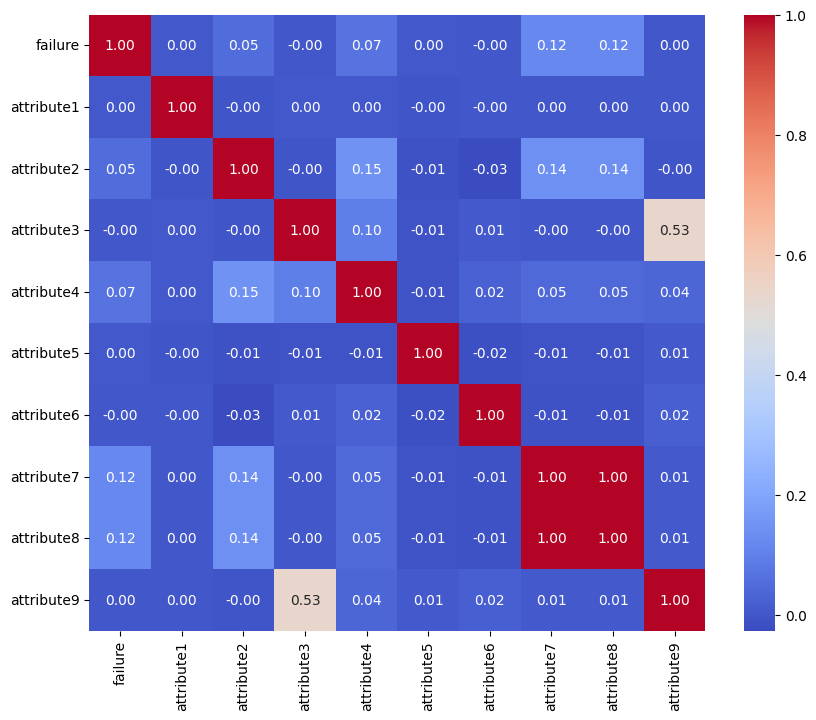

In [18]:
#Visualizamos la matriz de correlación con Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.show()

#Vemos muy poca correlacion entre variables, menos una altisima correlacion entre la columna 7 y 8

In [20]:
#Arroja los valores missing en % de top 10 columnas

df_na = (df.isnull().sum() / len(df)) * 100
df_na = df_na.drop(df_na[df_na == 0].index).sort_values(ascending=False)[:30]
missing_data = pd.DataFrame({'Missing Ratio' :df_na})
missing_data.head(10)

#No tenemos nulos, si tenemos muchos valores en 0


,Missing Ratio


En esta etapa, analizaremos con el paquete autogluon(un paquete de autoML) cuales podrian ser los modelos que mejor sirvan para nuestro problema, para a partir de eso elegir el mejor modelo que se adecue a nuestro problema

In [21]:
from sklearn.model_selection import train_test_split
from autogluon.tabular import TabularDataset, TabularPredictor

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



In [22]:
#Separamos en train y test
x = df.drop("failure", axis = 1)
y = df["failure"]
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)

In [23]:
#Dividimos los datos en entrenamiento y test con una division 80% train y 20% test
train_data = TabularDataset(x.join(y)).sample(frac=0.8, random_state=42)
test_data = TabularDataset(x.join(y)).drop(train_data.index)     

In [24]:
#Especificamos nuestro predictor
predictor = TabularPredictor(label='failure').fit(train_data)

# Una vez completado el entrenamiento, se puede evaluar el modelo en los datos de prueba
performance = predictor.evaluate(test_data)

No path specified. Models will be saved in: "AutogluonModels\ag-20231206_184951"
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : Fast training time, ideal for initial prototyping.
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231206_184951"
=================== System Info ===================
AutoGluon Version:  1.0.0
Python Version:     3.8.6
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19041
CPU Count:          8
Memory Avail:       6

KeyboardInterrupt: 

In [ ]:
# Obtenemos el output el leaderboard con métricas adicionales que son importantes para nuestro problema en cuestion: f1, precision, recall y el score roc_auc
leaderboard = predictor.leaderboard(test_data, extra_metrics=['accuracy', 'f1', 'precision', 'recall', 'roc_auc'])
leaderboard

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being s

,model,score_test,accuracy,f1,precision,recall,roc_auc,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,CatBoost,0.999277,0.999277,0.000000,0.000000,0.000000,0.666884,0.9992,accuracy,0.007998,0.020168,3.230371,0.007998,0.020168,3.230371,1,True,7
1,XGBoost,0.999277,0.999277,0.000000,0.000000,0.000000,0.739452,0.9992,accuracy,0.039679,0.015556,0.689780,0.039679,0.015556,0.689780,1,True,11
2,KNeighborsUnif,0.999277,0.999277,0.000000,0.000000,0.000000,0.497689,0.9992,accuracy,0.147143,0.039786,2.249485,0.147143,0.039786,2.249485,1,True,1
3,RandomForestEntr,0.999277,0.999277,0.000000,0.000000,0.000000,0.814042,0.9992,accuracy,0.168023,0.105126,11.469605,0.168023,0.105126,11.469605,1,True,6
4,ExtraTreesEntr,0.999277,0.999277,0.000000,0.000000,0.000000,0.814084,0.9992,accuracy,0.176479,0.117709,3.514428,0.176479,0.117709,3.514428,1,True,9
5,ExtraTreesGini,0.999277,0.999277,0.000000,0.000000,0.000000,0.813401,0.9992,accuracy,0.190108,0.104907,3.799825,0.190108,0.104907,3.799825,1,True,8
6,RandomForestGini,0.999277,0.999277,0.000000,0.000000,0.000000,0.790099,0.9992,accuracy,0.197246,0.089632,12.209122,0.197246,0.089632,12.209122,1,True,5
7,NeuralNetTorch,0.999237,0.999237,0.000000,0.000000,0.000000,0.795690,0.9992,accuracy,0.120048,0.030109,64.812316,0.120048,0.030109,64.812316,1,True,12
8,NeuralNetFastAI,0.999116,0.999116,0.083333,0.166667,0.055556,0.848151,0.9996,accuracy,0.390182,0.057008,120.867259,0.390182,0.057008,120.867259,1,True,10
9,KNeighborsDist,0.998755,0.998755,0.000000,0.000000,0.000000,0.497689,0.9988,accuracy,0.136636,0.030034,0.379874,0.136636,0.030034,0.379874,1,True,2


In [ ]:
#De este resultado podemos deducir que LIGHTGBM y LIGHTGBM LARGE son los mejores modelos en base al f1 score. 
#La metrica accuracy no nos sirve porque al tener una clase tan desbalanceada, si nuestro modelo hiciera predicciones de que nunca hay una falla lograria valores cercanos a 99% de accuracy. Y nunca estariamos prediciendo una falla
#Nos inclinamos por f1 score, al ser una metrica que relaciona tanto precision como recall(es la media armonica), y donde tenemos en cuenta los falsos positivos y negativos, lo cual es fundamental ya que tenemos un costo distinto asociado a esto en base a lo que se comenta en el caso

2     0
5     0
15    0
18    0
20    0
Name: failure, dtype: int64

In [ ]:
y_pred = predictor.predict(test_data.drop(columns=['failure']))
y_pred.head()
performance

{'accuracy': 0.9986746455680952,
 'balanced_accuracy': 0.5274562472926686,
 'mcc': 0.05650335530764231,
 'roc_auc': 0.5993171942892613,
 'f1': 0.05714285714285714,
 'precision': 0.058823529411764705,
 'recall': 0.05555555555555555}

Ahora que elejimos el modelo, vamos a avanzar a generar el FE para el dataframe con Autofeat(otra libreria de autoML)

In [26]:
#auto_ml_pipeline_feature_generator = AutoMLPipelineFeatureGenerator()
#auto_ml_pipeline_feature_generator.fit_transform(X=df)
#Vemos que como output tenemos una separacion de las variable date, ya que esta libreria no hace transformaciones para variables numericas

Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    6104.31 MB
	Train Data (Original)  Memory Usage: 25.17 MB (0.4% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
			Note: Converting 1 features to boolean dtype as they only contain 2 unique values.
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting IdentityFeatureGenerator...
		Fitting CategoryFeatureGenerator...
			Fitting CategoryMemoryMinimizeFeatureGenerator...
		Fitting DatetimeFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Unused Original Features (Count: 1): ['attribute8']
		These features were not used to generate any of the output features. Add a feature generator compatible with these features to ut

,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute9,device,date,date.month,date.day,date.dayofweek
0,0,215630672,56,0,52,6,407438,0,7,0,1420070400000000000,1,1,3
1,0,61370680,0,3,0,6,403174,0,0,2,1420070400000000000,1,1,3
2,0,173295968,0,0,0,12,237394,0,0,3,1420070400000000000,1,1,3
3,0,79694024,0,0,0,6,410186,0,0,4,1420070400000000000,1,1,3
4,0,135970480,0,0,0,15,313173,0,3,5,1420070400000000000,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124489,0,18310224,0,0,0,10,353705,8,0,1044,1446422400000000000,11,2,0
124490,0,172556680,96,107,4,11,332792,0,13,1067,1446422400000000000,11,2,0
124491,0,19029120,4832,0,0,11,350410,0,0,1074,1446422400000000000,11,2,0
124492,0,226953408,0,0,0,12,358980,0,0,1080,1446422400000000000,11,2,0


In [29]:
df.head()

,date,device,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9
0,2015-01-01,S1F01085,0,215630672,56,0,52,6,407438,0,0,7
1,2015-01-01,S1F0166B,0,61370680,0,3,0,6,403174,0,0,0
2,2015-01-01,S1F01E6Y,0,173295968,0,0,0,12,237394,0,0,0
3,2015-01-01,S1F01JE0,0,79694024,0,0,0,6,410186,0,0,0
4,2015-01-01,S1F01R2B,0,135970480,0,0,0,15,313173,0,0,3


In [30]:
#Separamos el mes, dia, y año en el dataset ya que queremos ver si puede existir una estacionalidad
df['year'] = pd.to_datetime(df['date']).dt.year
df['month'] = pd.to_datetime(df['date']).dt.month
df['day'] = pd.to_datetime(df['date']).dt.day

In [31]:
df = df.drop('date',axis=1)
df.head()

,device,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9,year,month,day
0,S1F01085,0,215630672,56,0,52,6,407438,0,0,7,2015,1,1
1,S1F0166B,0,61370680,0,3,0,6,403174,0,0,0,2015,1,1
2,S1F01E6Y,0,173295968,0,0,0,12,237394,0,0,0,2015,1,1
3,S1F01JE0,0,79694024,0,0,0,6,410186,0,0,0,2015,1,1
4,S1F01R2B,0,135970480,0,0,0,15,313173,0,0,3,2015,1,1


Aplicamos autofeat

In [34]:
from autofeat import FeatureSelector
from sklearn.model_selection import train_test_split
from autofeat import AutoFeatRegressor, AutoFeatClassifier 

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124494 entries, 0 to 124493
Data columns (total 14 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   device      124494 non-null  object
 1   failure     124494 non-null  int64 
 2   attribute1  124494 non-null  int64 
 3   attribute2  124494 non-null  int64 
 4   attribute3  124494 non-null  int64 
 5   attribute4  124494 non-null  int64 
 6   attribute5  124494 non-null  int64 
 7   attribute6  124494 non-null  int64 
 8   attribute7  124494 non-null  int64 
 9   attribute8  124494 non-null  int64 
 10  attribute9  124494 non-null  int64 
 11  year        124494 non-null  int32 
 12  month       124494 non-null  int32 
 13  day         124494 non-null  int32 
dtypes: int32(3), int64(10), object(1)
memory usage: 11.9+ MB


In [36]:
#Antes, pasamos las variables categoricas a one hot encoding
df = pd.get_dummies(df, columns = ['device'])

In [37]:
df_filtered = df.loc[df['device_Z1F1HSWK'] == 1]
df_filtered

,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9,...,device_Z1F1HSWK,device_Z1F1Q9BD,device_Z1F1R76A,device_Z1F1RE71,device_Z1F1RJFA,device_Z1F1VMZB,device_Z1F1VQFY,device_Z1F26YZB,device_Z1F282ZV,device_Z1F2PBHX
1153,0,88886208,0,0,0,5,359637,0,0,6,...,True,False,False,False,False,False,False,False,False,False
2316,0,208877824,0,0,0,5,359637,0,0,6,...,True,False,False,False,False,False,False,False,False,False
3479,0,130088592,0,0,0,5,359638,0,0,6,...,True,False,False,False,False,False,False,False,False,False
4641,0,168502376,0,0,0,5,359770,0,0,6,...,True,False,False,False,False,False,False,False,False,False
5802,0,86334832,0,0,0,5,360858,0,0,6,...,True,False,False,False,False,False,False,False,False,False
6856,0,120187320,0,0,0,5,362008,0,0,6,...,True,False,False,False,False,False,False,False,False,False


In [39]:
fsel = FeatureSelector(verbose=1)

In [41]:
#Creamos una instancia del AutoFeatClassifier
auto_feat_classifier = AutoFeatClassifier(verbose=2, feateng_steps=1) #le colocamos verbose=2 para la mayor cantidad de mensajes en el progreso y reduciemos feateng steps para tener bajo costo computacional

In [42]:
#Ponemos las columnas con las que queremos realizar el FE, para evitar darle informacion de mas al autofeat(por el costo computacional principalmente)
feature_cols = ['attribute1', 'attribute2', 'attribute3','attribute4','attribute5','attribute6','attribute7','attribute8','attribute9']

In [43]:
#Armamos un dataset
X_FE = df[feature_cols]

In [44]:
X_FE

,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9
0,215630672,56,0,52,6,407438,0,0,7
1,61370680,0,3,0,6,403174,0,0,0
2,173295968,0,0,0,12,237394,0,0,0
3,79694024,0,0,0,6,410186,0,0,0
4,135970480,0,0,0,15,313173,0,0,3
...,...,...,...,...,...,...,...,...,...
124489,18310224,0,0,0,10,353705,8,8,0
124490,172556680,96,107,4,11,332792,0,0,13
124491,19029120,4832,0,0,11,350410,0,0,0
124492,226953408,0,0,0,12,358980,0,0,0


In [45]:
new_df = auto_feat_classifier.fit_transform(pd.DataFrame(X_FE), pd.DataFrame(y))

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\utils\validation.py:1183: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

2023-12-06 15:56:30,519 INFO: [AutoFeat] The 1 step feature engineering process could generate up to 63 features.
2023-12-06 15:56:30,520 INFO: [AutoFeat] With 124494 data points this new feature matrix would use about 0.03 gb of space.
2023-12-06 15:56:30,528 INFO: [feateng] Step 1: transformation of original features


2023-12-06 15:56:33,654 INFO: [feateng] Generated 25 transformed features from 9 original features - done.
2023-12-06 15:56:33,677 INFO: [feateng] Generated altogether 32 new features in 1 steps
2023-12-06 15:56:33,677 INFO: [feateng] Removing correlated features, as well as additions at the highest level
2023-12-06 15:56:33,772 INFO: [feateng] Generated a total of 21 additional features
2023-12-06 15:56:33,841 INFO: [featsel] Feature selection run 1/5


[featsel] Scaling data...done.


2023-12-06 16:08:43,159 INFO: [featsel]	 4 initial features.


2023-12-06 16:16:42,293 INFO: 
[featsel]	 Selected   4 features after noise filtering.
2023-12-06 16:16:42,308 INFO: [featsel] Feature selection run 2/5
2023-12-06 16:23:26,204 INFO: [featsel]	 4 initial features.


2023-12-06 16:31:35,251 INFO: 
[featsel]	 Selected   4 features after noise filtering.
2023-12-06 16:31:35,251 INFO: [featsel] Feature selection run 3/5
2023-12-06 16:40:45,087 INFO: [featsel]	 2 initial features.


2023-12-06 16:50:14,282 INFO: 
[featsel]	 Selected   2 features after noise filtering.
2023-12-06 16:50:14,288 INFO: [featsel] Feature selection run 4/5
2023-12-06 16:57:53,068 INFO: [featsel]	 4 initial features.


2023-12-06 17:06:57,950 INFO: 
[featsel]	 Selected   3 features after noise filtering.
2023-12-06 17:06:57,955 INFO: [featsel] Feature selection run 5/5
2023-12-06 17:15:10,278 INFO: [featsel]	 0 initial features.


2023-12-06 17:24:04,101 INFO: 
[featsel]	 Selected   4 features after noise filtering.
2023-12-06 17:24:04,105 INFO: [featsel] 4 features after 5 feature selection runs
2023-12-06 17:24:04,121 INFO: [featsel] 3 features after correlation filtering
2023-12-06 17:27:43,320 INFO: [featsel] 3 features after noise filtering
2023-12-06 17:27:43,322 INFO: [AutoFeat] Computing 3 new features.


2023-12-06 17:27:43,730 INFO: [AutoFeat]     3/    3 new features ...done.
2023-12-06 17:27:43,736 INFO: [AutoFeat] Final dataframe with 12 feature columns (3 new).
2023-12-06 17:27:43,736 INFO: [AutoFeat] Training final classification model.


2023-12-06 17:27:46,541 INFO: [AutoFeat] Trained model: largest coefficients:
2023-12-06 17:27:46,543 INFO: [-1.01273983]
2023-12-06 17:27:46,544 INFO: 0.472516 * sqrt(attribute8)
2023-12-06 17:27:46,545 INFO: 0.384408 * sqrt(attribute4)
2023-12-06 17:27:46,546 INFO: 0.043174 * sqrt(attribute2)
2023-12-06 17:27:46,567 INFO: [AutoFeat] Final score: 0.9432


In [46]:
#Guardamos este dataset, ya que nos tomo un tiempo de aprox 1 hora y media hasta que realizo el FE
new_df.to_csv(('new_df_FE.csv'))

In [53]:
#Vemos que nos agrego 3 columnas unicamente
new_df.describe()

,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9,sqrt(attribute8),sqrt(attribute2),sqrt(attribute4)
count,1.244940e+05,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000
mean,1.223881e+08,159.484762,9.940455,1.741120,14.222669,260172.657726,0.292528,0.292528,12.451524,0.048264,1.879690,0.256722
std,7.045933e+07,2179.657730,185.747321,22.908507,15.943028,99151.078547,7.436924,7.436924,191.425623,0.538703,12.488106,1.294306
min,0.000000e+00,0.000000,0.000000,0.000000,1.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.128476e+07,0.000000,0.000000,0.000000,8.000000,221452.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.227974e+08,0.000000,0.000000,0.000000,10.000000,249799.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.833096e+08,0.000000,0.000000,0.000000,12.000000,310266.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2.441405e+08,64968.000000,24929.000000,1666.000000,98.000000,689161.000000,832.000000,832.000000,18701.000000,28.844410,254.888211,40.816663


In [60]:
new_df

,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9,sqrt(attribute8),sqrt(attribute2),sqrt(attribute4)
0,215630672,56,0,52,6,407438,0,0,7,0.000000,7.483315,7.211103
1,61370680,0,3,0,6,403174,0,0,0,0.000000,0.000000,0.000000
2,173295968,0,0,0,12,237394,0,0,0,0.000000,0.000000,0.000000
3,79694024,0,0,0,6,410186,0,0,0,0.000000,0.000000,0.000000
4,135970480,0,0,0,15,313173,0,0,3,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
124489,18310224,0,0,0,10,353705,8,8,0,2.828427,0.000000,0.000000
124490,172556680,96,107,4,11,332792,0,0,13,0.000000,9.797959,2.000000
124491,19029120,4832,0,0,11,350410,0,0,0,0.000000,69.512589,0.000000
124492,226953408,0,0,0,12,358980,0,0,0,0.000000,0.000000,0.000000


In [55]:
#Ahora vamos a poner las 3 nuevas columnas en df original
columns_to_add = new_df[['sqrt(attribute8)', 'sqrt(attribute2)', 'sqrt(attribute4)']]
combined_df = df.join(columns_to_add)

In [56]:
combined_df

,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9,...,device_Z1F1RE71,device_Z1F1RJFA,device_Z1F1VMZB,device_Z1F1VQFY,device_Z1F26YZB,device_Z1F282ZV,device_Z1F2PBHX,sqrt(attribute8),sqrt(attribute2),sqrt(attribute4)
0,0,215630672,56,0,52,6,407438,0,0,7,...,False,False,False,False,False,False,False,0.000000,7.483315,7.211103
1,0,61370680,0,3,0,6,403174,0,0,0,...,False,False,False,False,False,False,False,0.000000,0.000000,0.000000
2,0,173295968,0,0,0,12,237394,0,0,0,...,False,False,False,False,False,False,False,0.000000,0.000000,0.000000
3,0,79694024,0,0,0,6,410186,0,0,0,...,False,False,False,False,False,False,False,0.000000,0.000000,0.000000
4,0,135970480,0,0,0,15,313173,0,0,3,...,False,False,False,False,False,False,False,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124489,0,18310224,0,0,0,10,353705,8,8,0,...,False,False,False,False,False,False,False,2.828427,0.000000,0.000000
124490,0,172556680,96,107,4,11,332792,0,0,13,...,False,False,False,False,False,False,False,0.000000,9.797959,2.000000
124491,0,19029120,4832,0,0,11,350410,0,0,0,...,False,False,False,False,False,False,False,0.000000,69.512589,0.000000
124492,0,226953408,0,0,0,12,358980,0,0,0,...,False,False,False,False,False,False,False,0.000000,0.000000,0.000000


In [57]:
#Ahora vamos a normalizar las variables numericas
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [58]:
features_to_scale = ['sqrt(attribute8)', 'sqrt(attribute2)', 'sqrt(attribute4)','attribute1','attribute2','attribute3','attribute4','attribute5','attribute6','attribute7','attribute8','attribute9']
scaler = MinMaxScaler()

In [61]:
scaled_features = scaler.fit_transform(combined_df[features_to_scale])

In [62]:
# Replace the original features with the scaled features
combined_df[features_to_scale] = scaled_features

In [63]:
combined_df.describe()

,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9,year,month,day,sqrt(attribute8),sqrt(attribute2),sqrt(attribute4)
count,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.000000,124494.0,124494.000000,124494.000000,124494.000000,124494.000000,124494.00000
mean,0.000851,0.501302,0.002455,0.000399,0.001045,0.136316,0.377514,0.000352,0.000352,0.000666,2015.0,4.028299,14.894196,0.001673,0.007375,0.00629
std,0.029167,0.288602,0.033550,0.007451,0.013751,0.164361,0.143874,0.008939,0.008939,0.010236,0.0,2.572167,8.759542,0.018676,0.048994,0.03171
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.0,1.000000,1.000000,0.000000,0.000000,0.00000
25%,0.000000,0.251023,0.000000,0.000000,0.000000,0.072165,0.321328,0.000000,0.000000,0.000000,2015.0,2.000000,7.000000,0.000000,0.000000,0.00000
50%,0.000000,0.502978,0.000000,0.000000,0.000000,0.092784,0.362462,0.000000,0.000000,0.000000,2015.0,3.000000,15.000000,0.000000,0.000000,0.00000
75%,0.000000,0.750837,0.000000,0.000000,0.000000,0.113402,0.450202,0.000000,0.000000,0.000000,2015.0,6.000000,22.000000,0.000000,0.000000,0.00000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2015.0,11.000000,31.000000,1.000000,1.000000,1.00000


Dado que tenemos un dataset enormemente desbalanceado, consideramos aplicar undersampling para balancear un poco el dataset. Ademas, separaremos antes una porcion de dataset para utilizar posteriormente en la optimizacion de hiperparametros

In [365]:
#Cargamos las librerias para undersampling
from imblearn.under_sampling import RandomUnderSampler
import lightgbm as lgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score, train_test_split

In [267]:
#Separamos train y test
x = combined_df.drop("failure", axis = 1)
y = combined_df["failure"]

In [274]:
#Separo una porcion de dataset para validacion y optimizacion de hiperparametros, un 20% del dataset original sera para validacion
validation_df, sample_df, y_validation_test, y_sample_train = train_test_split(x,y, test_size=0.8, random_state=42)

In [277]:
sample_df.shape

(99596, 1184)

In [284]:
#Ahora vamos a dejar nuestro nuevo dataset separado del dataset de validacion
columns_to_add = y_sample_train
combined_df = sample_df.join(columns_to_add)

In [285]:
combined_df #este es nuestro nuevo dataset final

,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9,year,...,device_Z1F1RJFA,device_Z1F1VMZB,device_Z1F1VQFY,device_Z1F26YZB,device_Z1F282ZV,device_Z1F2PBHX,sqrt(attribute8),sqrt(attribute2),sqrt(attribute4),failure
39987,0.004103,0.0,0.000401,0.000000,0.113402,0.394979,0.0,0.0,0.002246,2015,...,False,False,False,False,False,False,0.0,0.0,0.000000,0
112619,0.505482,0.0,0.000000,0.003601,0.577320,0.364487,0.0,0.0,0.000053,2015,...,False,False,False,False,False,False,0.0,0.0,0.060012,0
69989,0.243960,0.0,0.000000,0.000000,0.072165,0.310934,0.0,0.0,0.000000,2015,...,False,False,False,False,False,False,0.0,0.0,0.000000,0
117935,0.250435,0.0,0.000000,0.000000,0.072165,0.624375,0.0,0.0,0.000053,2015,...,False,False,False,False,False,False,0.0,0.0,0.000000,0
68317,0.786203,0.0,0.000000,0.000000,0.082474,0.406780,0.0,0.0,0.000000,2015,...,False,False,False,False,False,False,0.0,0.0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42974,0.717590,0.0,0.000000,0.000000,0.082474,0.320202,0.0,0.0,0.000000,2015,...,False,False,False,False,False,False,0.0,0.0,0.000000,0
70072,0.361488,0.0,0.000000,0.000000,0.092784,0.678650,0.0,0.0,0.000000,2015,...,False,False,False,False,False,False,0.0,0.0,0.000000,0
41811,0.786362,0.0,0.000000,0.000000,0.072165,0.287967,0.0,0.0,0.000000,2015,...,False,False,False,False,False,False,0.0,0.0,0.000000,0
84192,0.563133,0.0,0.000000,0.000000,0.175258,0.000068,0.0,0.0,0.000000,2015,...,False,False,False,False,False,False,0.0,0.0,0.000000,0


In [288]:
#Separamos train y test
x = combined_df.drop("failure", axis = 1)
y = combined_df["failure"]

In [289]:
#Definimos el metodo de undersampling
undersample = RandomUnderSampler(sampling_strategy=0.20, random_state=42)

In [290]:
#Creamos el nuevo dataset
x, y = undersample.fit_resample(x, y)

In [291]:
#Separo el dataset en train y test
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [353]:
# Vemos el tamaño del dataset de train
print('X_train : ')
print(X_train.info())
print('Tamaño del data frame')
X_train.shape

X_train : 
<class 'pandas.core.frame.DataFrame'>
Index: 422 entries, 102556 to 63225
Columns: 1184 entries, attribute1 to sqrt(attribute4)
dtypes: bool(1169), float64(12), int32(3)
memory usage: 529.6 KB
None
Tamaño del data frame


(422, 1184)

In [352]:
# Vemos el tamaño del dataset de test
print('X_test : ')
print(X_test.info())
print('Tamaño del data frame')
X_test.shape

X_test : 
<class 'pandas.core.frame.DataFrame'>
Index: 106 entries, 8456 to 40483
Columns: 1184 entries, attribute1 to sqrt(attribute4)
dtypes: bool(1169), float64(12), int32(3)
memory usage: 133.0 KB
None
Tamaño del data frame


(106, 1184)

Comenzamos a crear nuestro modelo

In [408]:
#Unificamos el train y test con la target
dtrain = lgb.Dataset(
        data=X_train,
        label=y_train,
        #weight=np.where(y_train.isin([1]), 12.000001, 1.0),
        free_raw_data=False
)

In [409]:
dtest = lgb.Dataset(
        data=X_test,
        label=y_test
)

In [410]:
parameters = {
    'boosting_type': 'gbdt',
    'objective': 'binary',
    'learning_rate': 0.01,
    'lambda_l1': 0.1,
    'lambda_l2': 0.2,
    'max_depth': -1,
    #'early_stopping_rounds':10

}

In [411]:
# Aca visualizamos graficamente cual es el numero optimo de iteraciones para entrenar nuestro modelo
eval_results = {}
lgb.train(
    parameters,
    dtrain,
    num_boost_round=1000,
    valid_sets=[dtrain, dtest],
    valid_names=['train', 'test'],
    callbacks=[lgb.record_evaluation(eval_results)]
)


[LightGBM] [Info] Number of positive: 69, number of negative: 353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 422, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.163507 -> initscore=-1.632362
[LightGBM] [Info] Start training from score -1.632362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='binary_logloss'>

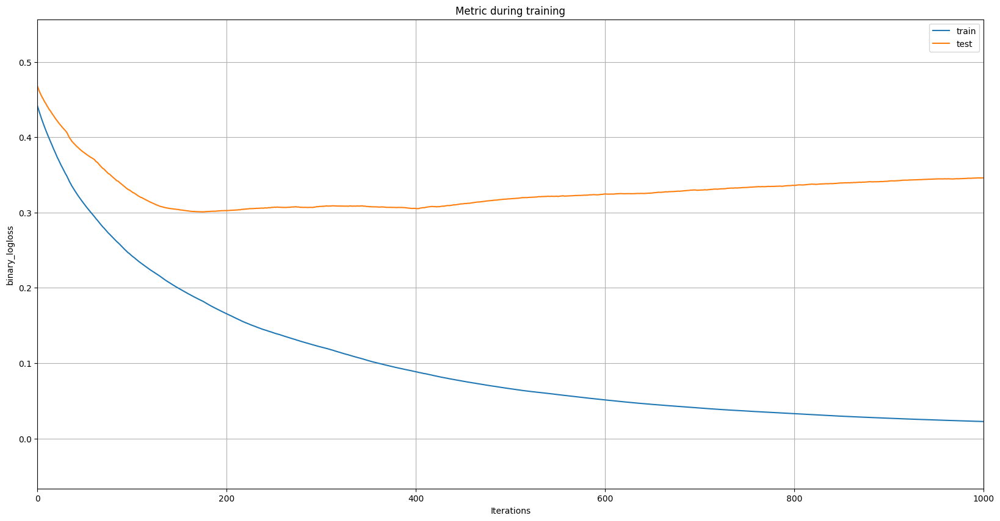

In [412]:
# Now, you can use eval_results with lgb.plot_metric
lgb.plot_metric(eval_results, xlim = (0,1000),figsize = (20,10))

In [413]:
# Train a LightGBM classifier
dtrain = lgb.Dataset(
        data=X_train,
        label=y_train,
        #weight=np.where(y_train.isin([1]), 12.000000, 1.0),
        free_raw_data=False
)

# Definir los hiperparámetros
parameters = {
    'boosting_type': 'gbdt',
    'objective': 'binary',
    'learning_rate': 0.01,
    'lambda_l1': 0.1,
    'lambda_l2': 0.2,
    'max_depth': -1,
    #'early_stopping_rounds':10

}

bst = lgb.train(
  params=parameters,
  train_set=dtrain,
  num_boost_round = 180,
)

[LightGBM] [Info] Number of positive: 69, number of negative: 353
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 422, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.163507 -> initscore=-1.632362
[LightGBM] [Info] Start training from score -1.632362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [414]:
# Hacemos las predicciones en el dataset de test
y_pred = bst.predict(X_test, num_iteration=bst.best_iteration)
# Hacemos las predicciones en el dataset de train
y_pred_train = bst.predict(X_train, num_iteration=bst.best_iteration)
# Convertimos las predicciones a (0 or 1)
y_pred_binary = np.round(y_pred)
y_pred_binary_train = np.round(y_pred_train)

In [415]:
# Evaluamos el modelo en test
accuracy = accuracy_score(y_test, y_pred_binary)
confusion = confusion_matrix(y_test, y_pred_binary)
report = classification_report(y_test, y_pred_binary)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{confusion}")
print(f"Classification Report:\n{report}")

Accuracy: 0.8679245283018868
Confusion Matrix:
[[85  2]
 [12  7]]
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.98      0.92        87
           1       0.78      0.37      0.50        19

    accuracy                           0.87       106
   macro avg       0.83      0.67      0.71       106
weighted avg       0.86      0.87      0.85       106



In [416]:
# Evaluamos el modelo en train
accuracy = accuracy_score(y_train, y_pred_binary_train)
confusion = confusion_matrix(y_train, y_pred_binary_train)
report = classification_report(y_train, y_pred_binary_train)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{confusion}")
print(f"Classification Report:\n{report}")

Accuracy: 0.9289099526066351
Confusion Matrix:
[[345   8]
 [ 22  47]]
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       353
           1       0.85      0.68      0.76        69

    accuracy                           0.93       422
   macro avg       0.90      0.83      0.86       422
weighted avg       0.93      0.93      0.93       422



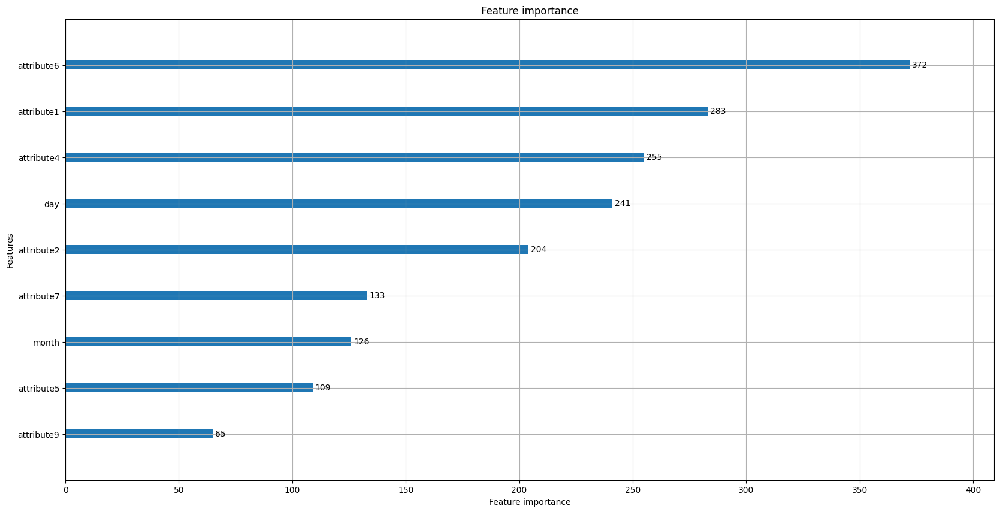

In [417]:
#Feature importance. Aca vemos que  atribute6 es la mas importante
lgb.plot_importance(bst, figsize=(20, 10), importance_type='split',max_num_features = 30)  # You can choose 'split' or 'gain' for importance_type
plt.show()

Aca realizamos la optimizacion bayesiana

In [318]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from bayes_opt import BayesianOptimization
from sklearn.metrics import roc_auc_score

In [340]:
from sklearn.metrics import precision_score, recall_score, f1_score

In [344]:
# Define an objective function
def lgb_evaluate(num_leaves, colsample_bytree, subsample, max_depth, reg_alpha, reg_lambda):
    params = {
        'num_leaves': int(num_leaves),
        'colsample_bytree': max(min(colsample_bytree, 1), 0),
        'subsample': max(min(subsample, 1), 0),
        'max_depth': int(max_depth),
        'reg_alpha': max(reg_alpha, 0),
        'reg_lambda': max(reg_lambda, 0),
    }
    clf = lgb.LGBMClassifier(**params)
    clf.fit(validation_df, y_validation_test)
    y_pred_proba = clf.predict_proba(validation_df)[:,1]
    # Convert probabilities to class labels using 0.5 as the threshold
    y_pred = [1 if proba >= 0.5 else 0 for proba in y_pred_proba]

    precision = precision_score(y_validation_test, y_pred)
    recall = recall_score(y_validation_test, y_pred)
    f1 = f1_score(y_validation_test, y_pred)

    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")

    return f1

In [345]:
# Define possible parameter ranges
lgbBO = BayesianOptimization(lgb_evaluate, {
        'num_leaves': (2, 38),
        'colsample_bytree': (1, 5),
        'subsample': (1, 7),
        'max_depth': (5, 10),
        'reg_alpha': (1, 8),
        'reg_lambda': (1, 7),
 })

In [346]:
# Execute optimization
lgbBO.maximize(n_iter=100, init_points=2, acq='ei', xi=0.0)

|   iter    |  target   | colsam... | max_depth | num_le... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------


C:\Users\fpallares\AppData\Local\Temp\ipykernel_6580\4044742890.py:2: DeprecationWarning:


Passing acquisition function parameters or gaussian process parameters to maximize
is no longer supported, and will cause an error in future releases. Instead,
please use the "set_gp_params" method to set the gp params, and pass an instance
 of bayes_opt.util.UtilityFunction using the acquisition_function argument




[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 2         | 0.0       | 1.96      | 7.073     | 17.98     | 6.062     | 6.254     | 3.701     |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 3         | 0.0       | 1.286     | 5.646     | 18.49     | 7.253     | 5.325     | 5.772     |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 5         | 0.0       | 2.246     | 10.0      | 2.0       | 1.0       | 1.0       | 1.0       |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 9         | 0.0       | 5.0       | 5.0       | 7.328     | 6.592     | 1.0       | 4.652     |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448


c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 10        | 0.0       | 3.246     | 8.03      | 7.898     | 1.0       | 5.342     | 3.857     |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training be

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 17        | 0.0       | 5.0       | 10.0      | 38.0      | 7.753     | 1.0       | 3.998     |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 18        | 0.0       | 5.0       | 8.329     | 38.0      | 1.0       | 6.097     | 4.01      |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 27        | 0.0       | 1.0       | 10.0      | 27.33     | 1.0       | 7.0       | 7.0       |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

c:\Users\fpallares\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.0
Recall: 0.0
F1 Score: 0.0
| 29        | 0.0       | 5.0       | 10.0      | 25.75     | 6.992     | 1.0       | 1.0       |
[LightGBM] [Info] Number of positive: 18, number of negative: 24880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 24898, number of used features: 501
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000723 -> initscore=-7.231448
[LightGBM] [Info] Start training from score -7.231448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

In [343]:
# Print out the best parameters
print(lgbBO.max)

{'target': 0.9994819578420865, 'params': {'colsample_bytree': 5.0, 'max_depth': 10.0, 'num_leaves': 23.518503301340477, 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 1.0}}


In [347]:
# Assuming lgbBO is an instance of bayes_opt.BayesianOptimization and
# the optimization has been completed by running lgbBO.maximize(...)

# Get all results and sort them by the 'target' key in descending order
sorted_results = sorted(lgbBO.res, key=lambda x: x['target'], reverse=True)

# Now, iterate through the sorted results
for i, res in enumerate(sorted_results):
    print(f"Iteration {i + 1}:")
    print("Hyperparameters:")
    for key in res['params'].keys():
        print(f"  {key}: {res['params'][key]}")
    print(f"Target: {res['target']}")
    print()  # Print an empty line for better readability

Iteration 1:
Hyperparameters:
  colsample_bytree: 5.0
  max_depth: 10.0
  num_leaves: 38.0
  reg_alpha: 1.0
  reg_lambda: 1.0
  subsample: 7.0
Target: 0.6666666666666666

Iteration 2:
Hyperparameters:
  colsample_bytree: 5.0
  max_depth: 10.0
  num_leaves: 38.0
  reg_alpha: 1.0
  reg_lambda: 1.0
  subsample: 1.0186237192074405
Target: 0.6666666666666666

Iteration 3:
Hyperparameters:
  colsample_bytree: 1.5567941851823097
  max_depth: 10.0
  num_leaves: 38.0
  reg_alpha: 1.0
  reg_lambda: 1.0
  subsample: 4.0099182893083585
Target: 0.6666666666666666

Iteration 4:
Hyperparameters:
  colsample_bytree: 1.9815775041572892
  max_depth: 10.0
  num_leaves: 33.70436142596608
  reg_alpha: 1.0
  reg_lambda: 1.0
  subsample: 1.0
Target: 0.6666666666666666

Iteration 5:
Hyperparameters:
  colsample_bytree: 1.5438398124635713
  max_depth: 10.0
  num_leaves: 32.97037261102776
  reg_alpha: 1.0
  reg_lambda: 1.0
  subsample: 7.0
Target: 0.6666666666666666

Iteration 6:
Hyperparameters:
  colsample_by

Ahora generamos nuestro modelo con los mejores hiperparametros elegidos

In [418]:
#Unificamos el train y test con la target
dtrain = lgb.Dataset(
        data=X_train,
        label=y_train,
        #weight=np.where(y_train.isin([1]), 12.000001, 1.0),
        free_raw_data=False
)

In [419]:
dtest = lgb.Dataset(
        data=X_test,
        label=y_test
)

In [420]:
parameters = {
  'colsample_bytree': 1,
  'max_depth': 10,
  'num_leaves': 31,
  'reg_alpha': 1,
  'reg_lambda': 1,
  'subsample': 5,
  'bagging_fraction': 1
    #'early_stopping_rounds':10

}
#Elegimos una iteracion del medio y no la mejor, dado que en la practica suele funcionar mejor no utilizar la mejor iteracion de la OB
#'target': 0.8543689320388349, 'params': {'colsample_bytree': 0.7025754516190214, 'max_depth': 5.6921667330495875, 'num_leaves': 24.43984261822645, 'reg_alpha': 0.5389236139436593, 'reg_lambda': 3.8193888060351178, 'subsample': 0.7178707946126475}

In [421]:
# Aca visualizamos graficamente cual es el numero optimo de iteraciones para entrenar nuestro modelo
eval_results = {}
lgb.train(
    parameters,
    dtrain,
    num_boost_round=5000,
    valid_sets=[dtrain, dtest],
    valid_names=['train', 'test'],
    callbacks=[lgb.record_evaluation(eval_results)]
)

[LightGBM] [Warning] bagging_fraction is set=1, subsample=5 will be ignored. Current value: bagging_fraction=1
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] bagging_fraction is set=1, subsample=5 will be ignored. Current value: bagging_fraction=1
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 422, number of used features: 14
[LightGBM] [Warning] bagging_fraction is set=1, subsample=5 will be ignored. Current value: bagging_fraction=1
[LightGBM] [Warning] Accuracy may be bad since you didn't

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='l2'>

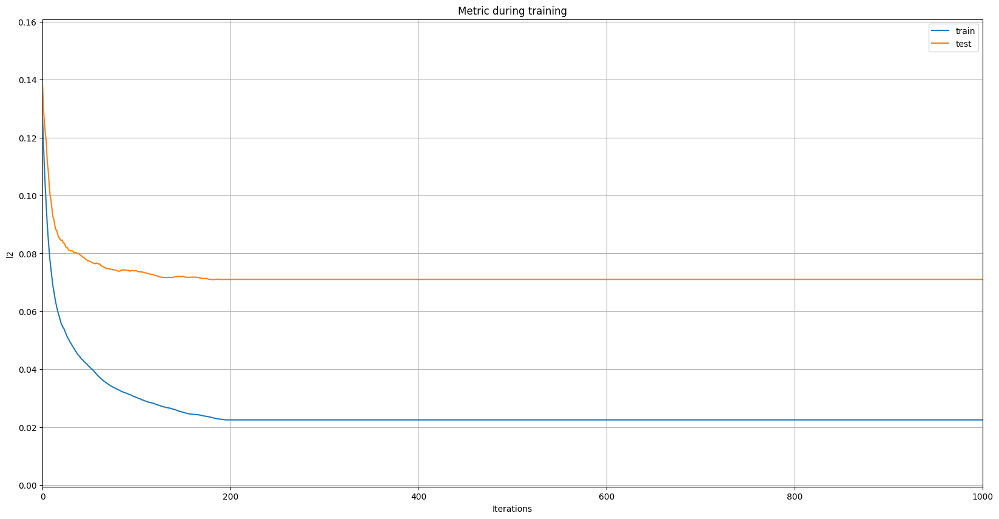

In [422]:
# Now, you can use eval_results with lgb.plot_metric
lgb.plot_metric(eval_results, xlim = (0,1000),figsize = (20,10))

In [423]:
# Train a LightGBM classifier
dtrain = lgb.Dataset(
        data=X_train,
        label=y_train,
        #weight=np.where(y_train.isin([1]), 12.000000, 1.0),
        free_raw_data=False
)

# Definir los hiperparámetros
parameters = {
  'colsample_bytree': 1,
  'max_depth': 10,
  'num_leaves': 31,
  'reg_alpha': 1,
  'reg_lambda': 1,
  'subsample': 5,
  'bagging_fraction': 1
    #'early_stopping_rounds':10

}

bst = lgb.train(
  params=parameters,
  train_set=dtrain,
  num_boost_round = 200,
)

[LightGBM] [Warning] bagging_fraction is set=1, subsample=5 will be ignored. Current value: bagging_fraction=1
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] bagging_fraction is set=1, subsample=5 will be ignored. Current value: bagging_fraction=1
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 422, number of used features: 14
[LightGBM] [Info] Start training from score 0.163507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

In [424]:
y_pred = bst.predict(X_test, num_iteration=bst.best_iteration)
y_pred_train = bst.predict(X_train, num_iteration=bst.best_iteration)
y_pred_binary = np.round(y_pred)
y_pred_binary_train = np.round(y_pred_train)

# Evaluate the model's performance en test
accuracy = accuracy_score(y_test, y_pred_binary)
confusion = confusion_matrix(y_test, y_pred_binary)
report = classification_report(y_test, y_pred_binary)

# Print the evaluation results
print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{confusion}")
print(f"Classification Report:\n{report}")

Accuracy: 0.9339622641509434
Confusion Matrix:
[[85  2]
 [ 5 14]]
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        87
           1       0.88      0.74      0.80        19

    accuracy                           0.93       106
   macro avg       0.91      0.86      0.88       106
weighted avg       0.93      0.93      0.93       106



In [425]:
# Evaluate the model's performance en train
accuracy = accuracy_score(y_train, y_pred_binary_train)
confusion = confusion_matrix(y_train, y_pred_binary_train)
report = classification_report(y_train, y_pred_binary_train)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{confusion}")
print(f"Classification Report:\n{report}")

Accuracy: 0.9786729857819905
Confusion Matrix:
[[351   2]
 [  7  62]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       353
           1       0.97      0.90      0.93        69

    accuracy                           0.98       422
   macro avg       0.97      0.95      0.96       422
weighted avg       0.98      0.98      0.98       422



El modelo final que tenemos performa con un 80% de f1 score en el dataset de testeo, con hiperparametros optimizados. A partir de lo que conocemos sobre el problema en cuestion, es el mejor resultado que pudimos obtener, sin embargo es necesario conocer mas el negocio para desarrollar nuevos FE y metodos que nos permitan optimizar el resultado